# Predictor de ventas del area Cosmetica por sectores para Stanhome

*Este proyecto se realiza bajo la solicitud del departamento de Marketing, quienes luego de ver la disminución de ventas del área de Beauty (cosmética), han solicitado la verificación de ventas de sus productos estrellas y la repercusión de las ofertas.*

# Hipótesis 
El tipo de oferta influye sobre la decisión de compra de acuerdo a la zona del país. 


# Datos disponibles
Se cuenta con varias tablas de Excel, que contienen:
-	Por mes (de los últimos 3 anos), las compras realizadas por área de productos por comprador y catalogo
-	Ofertas realizadas por producto por catalogo
-	Información de los compradores (fechas de alta, fecha de ultima compra, fechas de nacimiento, zona a la que pertenecen, zona de envío de productos)
-	Fechas (semana Stanhome) de catálogos


# Variables
*Variable Dependiente (efecto):* 
- PVP producto 
- Unidades vendidas

*Variable Independiente (causa):* 
- Promociones
- Zona de residencia del comprador

*Variable interviniente:* 
- Fecha de venta 
- Localización en el catalogo 
- Tipología de cliente (Consejera, VIP_client)


# Carga de librerias

In [58]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
import phik
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, r2_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn import preprocessing, metrics, linear_model, model_selection
from sklearn.tree import DecisionTreeRegressor, plot_tree
from scipy.stats import shapiro, skew, iqr
from scipy import stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import load_boston
from sklearn.feature_selection import SelectKBest
import statsmodels as sm
import statsmodels.api as sm

%matplotlib inline


In [ ]:
string = ()
sys.path.append(string)
sys.path

In [ ]:
sys.path

In [ ]:
current_path = os.getcwd()
current_path

**Para el estudio usaremos los .xlsx desde el 2019 por catalogo (son 18 catalogos por ano), los cuales tendran especificamente los productos de cosmetica a estudiar. Aun pendiente de recibir por Stanhome, pero sabemos que los datos estan bastantes bien (no hay datos nulos, ni outliers), porque proceden directamente del CRM, a continuacion mostramos la data de un catalogo, para ver como son los datos.**

In [41]:
data = pd.read_excel("Data_STH.xlsx")


In [4]:
data.describe()

,CICLO,ARTICULO,QTY,DTO,COD-MOV,PVP,PVP.ART,PVP_TOT_FACT,AÑO,MES,CATALOGO,COD_POST,situacion,EDAD
count,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000,41997.000000
mean,201946.601853,1.657714,2.043075,24.860180,2202.440412,20.938237,40.913661,247.743833,2019.374289,6.361573,9.176941,25078.824821,2.136295,58.801819
std,114.068300,0.573293,2.032531,8.278284,11.105635,15.502899,57.704981,179.612322,1.139473,3.180472,4.910787,13888.603505,1.898723,15.597691
min,201801.000000,1.000000,1.000000,0.000000,2200.000000,4.000000,4.000000,7.900000,2018.000000,1.000000,1.000000,1002.000000,1.000000,18.000000
25%,201815.000000,1.000000,1.000000,20.000000,2200.000000,9.000000,11.950000,137.150000,2018.000000,4.000000,5.000000,13610.000000,1.000000,48.000000
50%,201914.000000,2.000000,1.000000,25.000000,2200.000000,15.940000,25.000000,207.080000,2019.000000,6.000000,9.000000,27320.000000,1.000000,61.000000
75%,202017.000000,2.000000,2.000000,30.000000,2200.000000,29.950000,59.890000,302.050000,2020.000000,9.000000,14.000000,36472.000000,2.000000,71.000000
max,202117.000000,3.000000,48.000000,52.000000,2290.000000,59.990000,2695.500000,6343.820000,2021.000000,12.000000,18.000000,53001.000000,9.000000,96.000000


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49393 entries, 0 to 49392
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   REGION            49393 non-null  object 
 1   ZONA              49393 non-null  object 
 2   CICLO             49393 non-null  int64  
 3   SEMANA (SST)      49393 non-null  int64  
 4   YEAR              49393 non-null  int64  
 5   MONTH             49393 non-null  int64  
 6   DATE              49393 non-null  object 
 7   #_FACTURA         49393 non-null  int64  
 8   ID_STANHOME       49393 non-null  int64  
 9   PELLIDO Y NOMBRE  49393 non-null  object 
 10  ITEM              49393 non-null  int64  
 11  COD_Pers_Item     49393 non-null  object 
 12  DESCR.ITEM        49393 non-null  object 
 13  ARTICULO          49393 non-null  int64  
 14  DESCR.ART.        49393 non-null  object 
 15  PICK              49393 non-null  int64  
 16  %DTO.             49393 non-null  float6

In [25]:
data.columns

Index(['REGION', 'ZONA', 'CICLO', 'SEMANA (SST)', 'YEAR', 'MONTH', 'DATE',
       '#_FACTURA', 'ID_STANHOME', 'PELLIDO Y NOMBRE', 'ITEM', 'COD_Pers_Item',
       'DESCR.ITEM', 'ARTICULO', 'DESCR.ART.', 'PICK', '%DTO.', 'PAGINA',
       'COD-MOV.', 'AMBITO', 'PVP.ART.', 'PVP', 'Q.FACTURADA',
       'PVP_TOT_FACTURA', 'PROMO', 'REGION_ID'],
      dtype='object')

In [22]:
def mapping_segmento(x):
    if x == 'CO':
        return 1
    else:
        return 0

In [23]:
def mapping_region(x):
    if x == 'CA':
        return 1
    elif x == 'GG':
        return 2
    elif x == 'SG':
        return 3
    elif x == 'MN':
        return 4
    else:
        return 5


In [54]:
def mapping_ITEM(x):
    if x == 'La Crème Essentielle':
        return 1
    elif x == 'All Purpose P.9104' or 'ALL PURPOSE 300ML':
        return 2
    elif x == "CREMA REAFIRM COLLAGEN":
        return 3

In [55]:
data['REGION_ID'] = data['REGION'].apply(mapping_region)
data['SEGMENTO_ID'] = data['AMBITO'].apply(mapping_segmento)
data['ITEM_ID'] = data['DESCR.ART.'].apply(mapping_ITEM)
data["ITEM_ID"].nunique()

2

In [56]:
df = data
df_1 = df[df["ITEM_ID"] == 2]
df_1.head(2)

,REGION,ZONA,CICLO,SEMANA (SST),YEAR,MONTH,DAY,DATE,#_FACTURA,ID_STANHOME,...,%DTO.,PAGINA,COD-MOV.,AMBITO,PVP.ART.,PVP,Q.FACTURADA,PVP_TOT_FACTURA,PROMO,ITEM_ID
1,SG,CS,201801,2018011,2018,1,NaN,2018-01-01,3269844,64198,...,20.0,58,2200,CP,12.0,12.0,1,156.80,NaN,2
3,CA,RS,201801,2018011,2018,1,NaN,2018-01-01,3269870,66123,...,25.0,58,2200,CP,7.9,7.9,1,217.68,NaN,2


<Figure size 1600x1500 with 0 Axes>

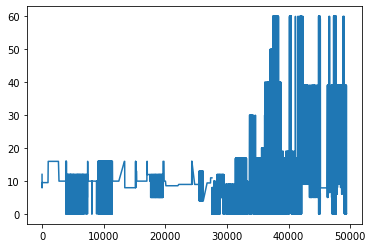

<Figure size 1600x1500 with 0 Axes>

In [76]:
df_1["PVP"].plot()


In [73]:
from statsmodels.tsa.stattools import adfuller, kpss
adfuller(df.values)[1]

6.036162250005129e-15

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/axes/_base.py:2283: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


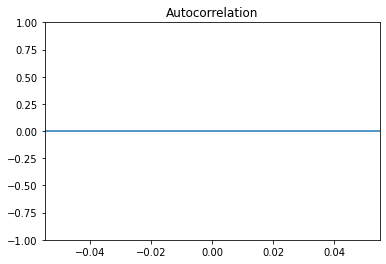

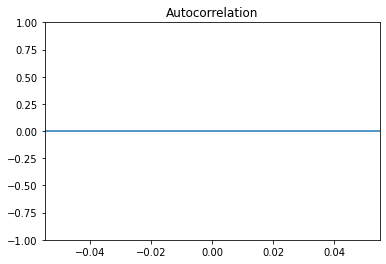

In [82]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df_1)

In [87]:
from pmdarima.arima import auto_arima
from pmdarima.arima import ARIMA
stepwise_model = auto_arima(df_1,
                            start_p=1,
                            start_q=1,
                            max_d=3,
                            max_p=5,
                            max_q=5,
                            m=12,
                            stationary=False,
                            trace=True,
                           stepwise=True)
print(stepwise_model.aic())
plt.plot(test)
plt.plot(predictions,color='red');

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

Definitivamente no es temporal 

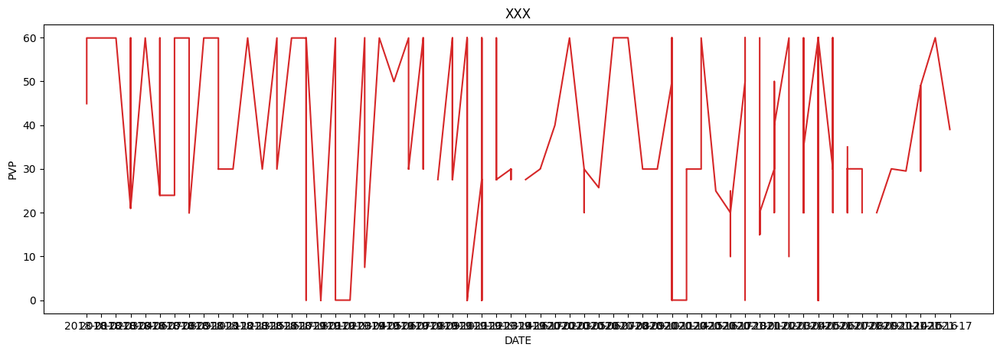

In [30]:
def plot_df(df_1, x, y, title="", xlabel='DATE', ylabel='PVP', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(df, x=df_1.DATE, y=df_1.PVP, title='XXX') 

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingW

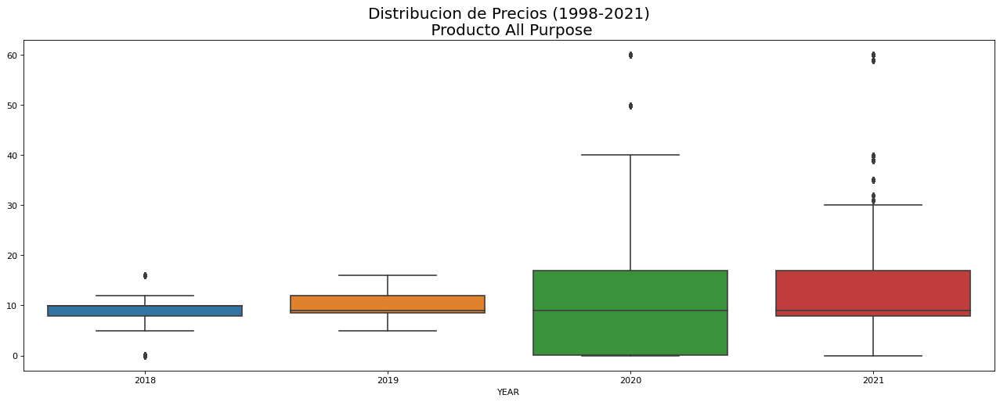

In [49]:
df = df.dropna(axis=0)
df_1[['YEAR', 'MONTH', 'DAY']] = df_1['DATE'].str.split('-', expand=True)
df_1['YEAR'] = df_1['YEAR'].astype(int)
df_1['MONTH'] = df_1['MONTH'].astype(int)
df_1['DAY'] = df_1['DAY'].astype(int)
df_1['new_date'] = pd.to_datetime(df[['YEAR', 'MONTH', 'DAY']])


years = df_1['YEAR'].unique()

# Draw Plot
fig, axes = plt.subplots( figsize=(20,7), dpi= 80)
sns.boxplot(x='YEAR', y=df_1.PVP.values, data=df_1)


# Set Title
axes.set_title('Distribucion de Precios (1998-2021)\n Producto Crema Reafirmante Collageno', fontsize=18); 
plt.show();

In [57]:
df = pd.read_excel("Data_STH.xlsx", parse_dates=['DATE'], index_col='DATE')


In [69]:
df = df["PVP"]
df = df.dropna()
df

KeyError: 'PVP'

In [68]:
decomposition = sm.tsa.seasonal_decompose(df['PVP'], model = 'additive', period=40)
fig = decomposition.plot()

KeyError: 'PVP'

In [10]:
df = data[['REGION_ID','CICLO', 'ARTICULO', 'QTY', 'DTO',
       'COD-MOV', 'PVP', 'PVP.ART', 'PVP_TOT_FACT', 'AÑO', 'MES',
       'CATALOGO', 'COD_POST', 'situacion', 'EDAD', 'SEGMENTO_ID']]

In [11]:
df_1 = df[df["ARTICULO"] == 1]
df_2 = df[df["ARTICULO"] == 2]
df_3 = df[df["ARTICULO"] == 3]

In [12]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16549 entries, 0 to 41996
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   REGION_ID     16549 non-null  int64  
 1   CICLO         16549 non-null  int64  
 2   ARTICULO      16549 non-null  int64  
 3   QTY           16549 non-null  int64  
 4   DTO           16549 non-null  int64  
 5   COD-MOV       16549 non-null  int64  
 6   PVP           16549 non-null  float64
 7   PVP.ART       16549 non-null  float64
 8   PVP_TOT_FACT  16549 non-null  float64
 9   AÑO           16549 non-null  int64  
 10  MES           16549 non-null  int64  
 11  CATALOGO      16549 non-null  int64  
 12  COD_POST      16549 non-null  int64  
 13  situacion     16549 non-null  int64  
 14  EDAD          16549 non-null  int64  
 15  SEGMENTO_ID   16549 non-null  int64  
dtypes: float64(3), int64(13)
memory usage: 2.1 MB


In [13]:
def data_report(df):
    # Sacamos los NOMBRES
    cols = pd.DataFrame(df.columns.values, columns=["COL_N"])

    # Sacamos los TIPOS
    types = pd.DataFrame(df.dtypes.values, columns=["DATA_TYPE"])

    # Sacamos los MISSINGS
    percent_missing = round(df.isnull().sum() * 100 / len(df), 2)
    percent_missing_df = pd.DataFrame(percent_missing.values, columns=["MISSINGS (%)"])

    # Sacamos los VALORES UNICOS
    unicos = pd.DataFrame(df.nunique().values, columns=["UNIQUE_VALUES"])
    
    percent_cardin = round(unicos['UNIQUE_VALUES']*100/len(df), 2)
    percent_cardin_df = pd.DataFrame(percent_cardin.values, columns=["CARDIN (%)"])

    concatenado = pd.concat([cols, types, percent_missing_df, unicos, percent_cardin_df], axis=1, sort=False)
    concatenado.set_index('COL_N', drop=True, inplace=True)


    return concatenado.T
        
data_report(df_1)

COL_N,REGION_ID,CICLO,ARTICULO,QTY,DTO,COD-MOV,PVP,PVP.ART,PVP_TOT_FACT,AÑO,MES,CATALOGO,COD_POST,situacion,EDAD,SEGMENTO_ID
DATA_TYPE,int64,int64,int64,int64,int64,int64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64
MISSINGS (%),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
UNIQUE_VALUES,5,56,1,30,15,4,38,169,10084,4,12,18,2150,6,77,2
CARDIN (%),0.03,0.34,0.01,0.18,0.09,0.02,0.23,1.02,60.93,0.02,0.07,0.11,12.99,0.04,0.47,0.01


In [ ]:
data["MONTH"].unique()
data['MONTH'] = data['MONTH'].to_numeric
df['a'] = pd.to_numeric(df['a'],errors = 'coerce')
data['MONTH'] = data['MONTH'].astype(float, errors = 'raise')

In [ ]:
data['YEAR'] = data['YEAR'].astype('int32').dtypes
#data['DAY'] = data['DAY'].astype(int, errors = 'raise')
#data['MONTH'] = data['MONTH'].astype(int, errors = 'raise')

# Primeras visualizaciones de los datos

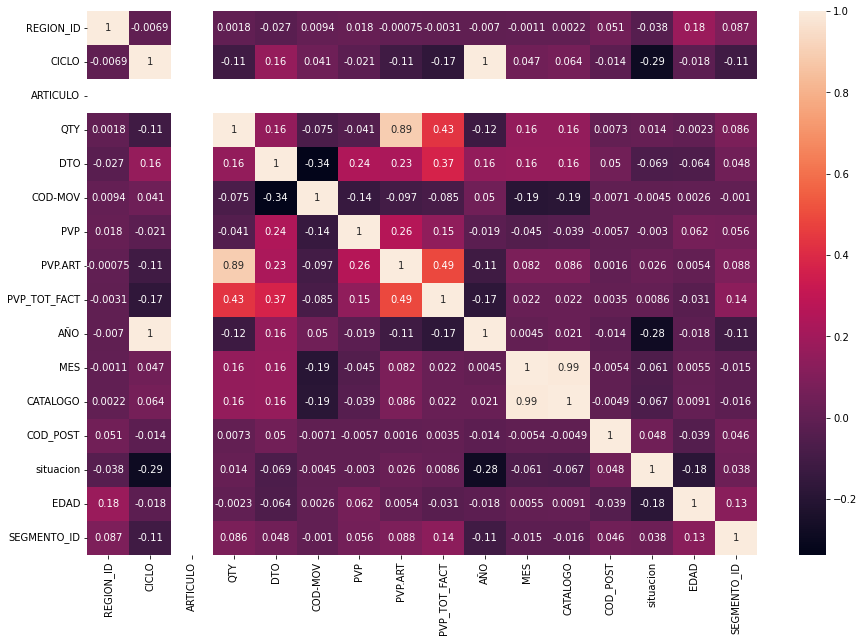

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(df_1.corr(), annot=True)
plt.show();

interval columns not set, guessing: ['REGION_ID', 'CICLO', 'ARTICULO', 'QTY', 'DTO', 'COD-MOV', 'PVP', 'PVP.ART', 'PVP_TOT_FACT', 'AÑO', 'MES', 'CATALOGO', 'COD_POST', 'situacion', 'EDAD', 'SEGMENTO_ID']


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/phik/data_quality.py:74: UserWarning: Not enough unique value for variable ARTICULO for analysis 1. Dropping this column
  col, df[col].nunique()


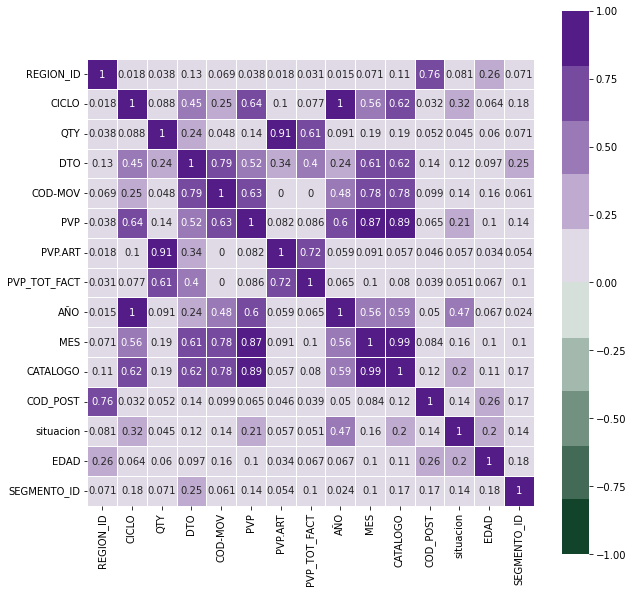

In [ ]:
# Esta matriz es un muy buen indicador sobre la relación entre los datos, teniendo en cuenta variables categóricas.

phik_matrix = df_1.phik_matrix()

plt.figure(figsize=(10,10))
sns.heatmap(phik_matrix,
            vmin=-1,
            vmax=1,
            center=0,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=10),
            square=True,
            annot=True,
            linewidths=.5);

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


<Figure size 1080x720 with 0 Axes>

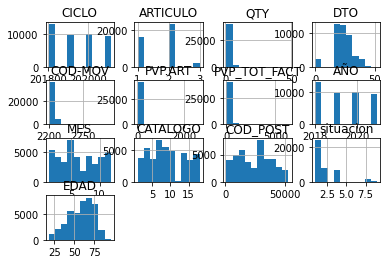

In [ ]:
plt.figure(figsize=(15,10))
df_1.drop(['PVP'], 1).hist()
plt.show()

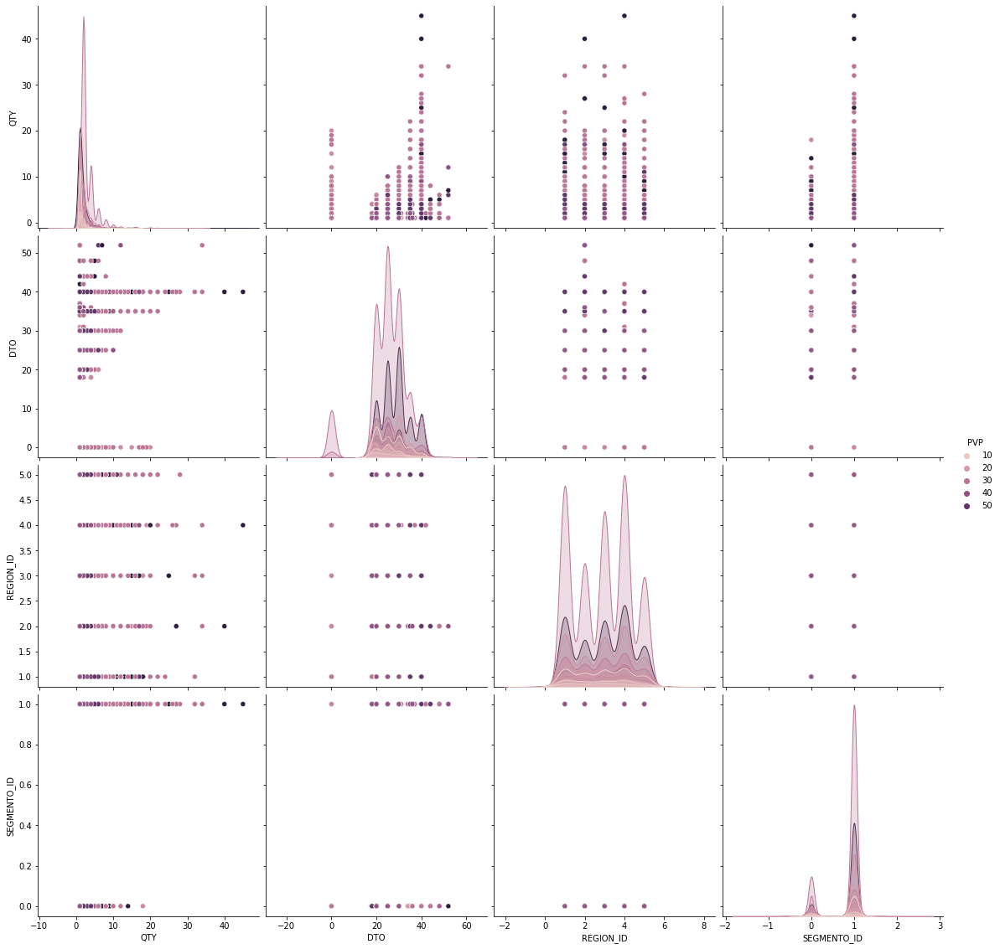

In [ ]:
sns.pairplot(df_1.dropna(),
            hue='PVP',
            height=4,
            vars=["QTY","DTO","REGION_ID", "SEGMENTO_ID"],
            kind='scatter');

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit

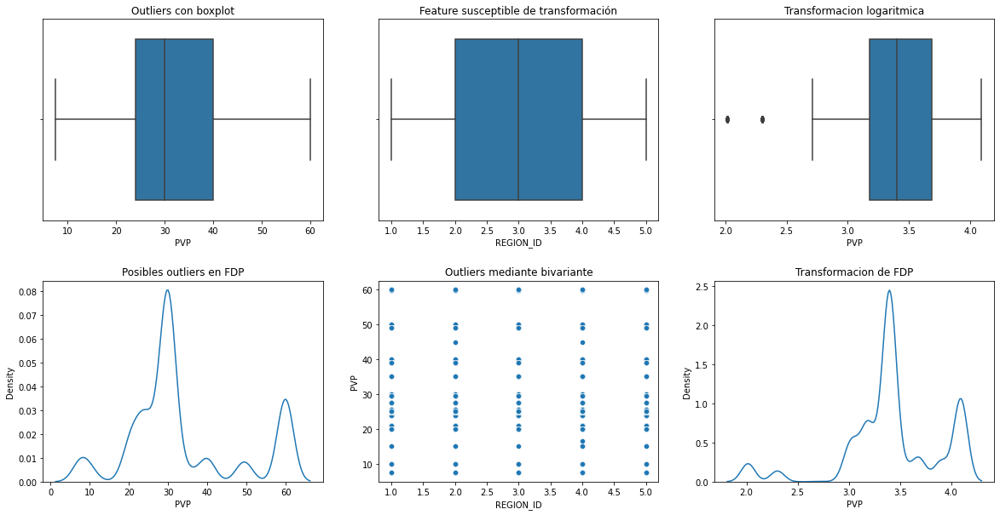

In [ ]:
# Target de precio en el dataset 
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
plt.subplots_adjust(hspace = 0.3)

# Outliers con boxplot
sns.boxplot(df_1['PVP'], ax=axes[0, 0])
axes[0, 0].set_title("Outliers con boxplot")

# Feature susceptible de transformación
sns.boxplot(df_1['REGION_ID'], ax=axes[0, 1])
axes[0, 1].set_title("Feature susceptible de transformación")

# Transformacion logaritmica
sns.boxplot(np.log(df_1['PVP']), ax=axes[0, 2])
axes[0, 2].set_title("Transformacion logaritmica")

# Posibles outliers mediante FDP
sns.kdeplot(df_1['PVP'], ax=axes[1, 0])
axes[1, 0].set_title("Posibles outliers en FDP")

# Outliers mediante bivariante
sns.scatterplot(data=df_1, x='REGION_ID', y='PVP', ax=axes[1, 1])
axes[1, 1].set_title("Outliers mediante bivariante")

# Transformacion de FDP
sns.kdeplot(np.log(df_1["PVP"]), ax=axes[1, 2])
axes[1, 2].set_title("Transformacion de FDP");

Len original: 16549
Len sin outliers en depth: 16549


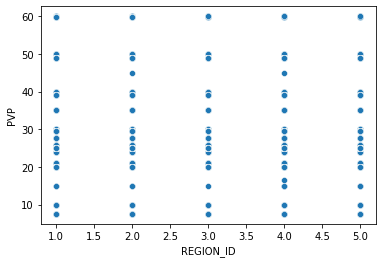

In [ ]:
def outliers_quantie(df, feature, param=1.5):  
        
    iqr_ = iqr(df[feature], nan_policy='omit')
    q1 = np.nanpercentile(df[feature], 25)
    q3 = np.nanpercentile(df[feature], 75)
    
    th1 = q1 - iqr_*param
    th2 = q3 + iqr_*param
    
    return df[(df[feature] >= th1) & (df[feature] <= th2)].reset_index(drop=True)

out_df1 = outliers_quantie(df_1, 'REGION_ID', 7)
print("Len original:", len(df_1))
print("Len sin outliers en depth:", len(out_df1))
sns.scatterplot(data=out_df1, x='REGION_ID', y='PVP');

In [ ]:
# Muy por debajo del nivel de significación (0.05) no se considera distribución normal.
print("Saphiro:", shapiro(df_1["PVP"]).pvalue)

# Para comprobar la asimetría de una variable siempre podemos calcular su valor skew
# 0 si es simetrica, >0 cola hacia la derecha, <0 cola hacia la izquierda
print("Asimetria:", skew(df_1["PVP"]))

Saphiro: 0.0
Asimetria: 0.6525538259986831


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


p-value Shapiro test Original:  0.0
Asimetria: 0.6525538259986831
p-value Shapiro test Logaritmic:  0.0
Asimetria: -0.8332193498600703
p-value Shapiro test Box-cox:  0.0
Asimetria: 0.016564595493449796


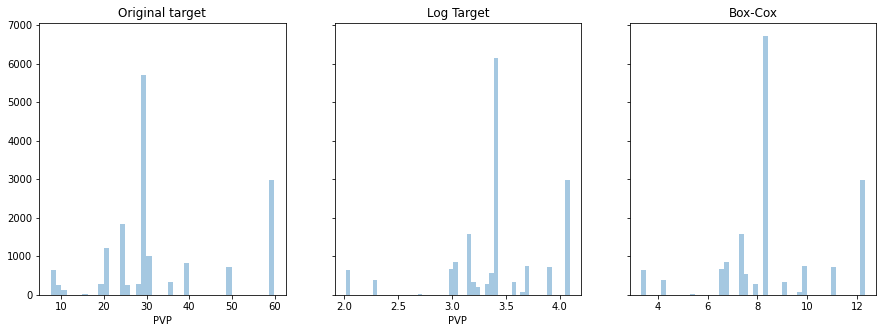

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Original target
print("p-value Shapiro test Original: ", shapiro(df_1["PVP"]).pvalue)
sns.distplot(df_1["PVP"], kde=False, ax=axes[0])
axes[0].set_title("Original target")
print("Asimetria:", skew(df_1["PVP"]))

# Logaritmic
print("p-value Shapiro test Logaritmic: ", shapiro(np.log(df_1["PVP"]),).pvalue)
sns.distplot(np.log(df_1["PVP"]),kde=False, ax=axes[1])
#axes[1].set_title("Log" + '\np-value Shapiro ' + str(shapiro_test))
axes[1].set_title("Log Target")
print("Asimetria:", skew(np.log(df_1["PVP"])))

# Box-cox
print("p-value Shapiro test Box-cox: ", shapiro(stats.boxcox(df_1["PVP"])[0]).pvalue)
sns.distplot(stats.boxcox(df_1["PVP"])[0],kde=False, ax=axes[2])
axes[2].set_title("Box-Cox");
print("Asimetria:", skew(stats.boxcox(df_1["PVP"])[0]))

In [ ]:
df_1.profile_report()

Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.48s/it]


In [14]:
X = df_1.drop(['PVP'], axis=1)     
y = df_1['PVP']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

In [18]:
print("Total features shape:", X.shape)
print("Train features shape:", X_train.shape)
print("Train target shape:", y_train.shape)
print("Test features shape:", X_test.shape)
print("Test target shape:", y_test.shape)

Total features shape: (16549, 15)
Train features shape: (13239, 15)
Train target shape: (13239,)
Test features shape: (3310, 15)
Test target shape: (3310,)


In [227]:
"""_, train_counts = np.unique(X_train, return_counts=True)
_, test_counts = np.unique(X_test, return_counts=True)
pd.DataFrame({"train": train_counts, "test":test_counts}, index=xxxxxxxxx)
"""

'_, train_counts = np.unique(X_train, return_counts=True)\n_, test_counts = np.unique(X_test, return_counts=True)\npd.DataFrame({"train": train_counts, "test":test_counts}, index=xxxxxxxxx)\n'

## RandomForestRegressor

In [53]:
rndf = RandomForestRegressor(n_estimators=100)

rndf.fit(X_train, y_train)

RandomForestRegressor()

In [54]:
names = df_1.columns
scores = sorted(zip(map(lambda x: round(x, 4), rndf.feature_importances_), names), reverse=True)
pd.DataFrame(scores, columns=['Score', 'Feature'])

,Score,Feature
0,0.4462,PVP
1,0.3838,QTY
2,0.1031,CICLO
3,0.0510,MES
4,0.0072,AÑO
5,0.0036,PVP_TOT_FACT
6,0.0028,COD-MOV
7,0.0013,DTO
8,0.0004,PVP.ART
9,0.0003,CATALOGO


In [55]:
# Predicciones
predicciones_rf = rndf.predict(X_test)
# Obtener scores y metricas
print('MAE:', metrics.mean_absolute_error(y_test, predicciones_rf))
print('MSE:', metrics.mean_squared_error(y_test, predicciones_rf))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predicciones_rf)))

r2_score(y_test, predicciones_rf)

MAE: 0.06357851963757642
MSE: 0.704936735652572
RMSE: 0.8396051069714691


0.9965713594203733

## Regresion Linear 

In [213]:
lm = LinearRegression(n_jobs=-1)
lm.fit(X_train, y_train)


In [215]:
print(f"Intercept:{lm.intercept_}")
print(f"Coef:{(lm.coef_)}")

Intercept:869.3237084682622
Coef:[ 1.98881991e-01 -3.49795857e-03 -1.73160097e-14 -9.91470419e+00
  1.50444184e-01 -5.95324982e-02  2.76828647e-01 -2.93061158e-03
 -1.70015256e-03 -1.70501259e-01  1.66517297e-01 -4.23309151e-06
 -7.62487367e-02  3.98213691e-02  1.31996373e+00]


In [216]:
coeff_df_1 = pd.DataFrame(lm.coef_,
                        X.columns,
                        columns=['Coefficient'])
coeff_df_1

,Coefficient
REGION_ID,1.988820e-01
CICLO,-3.497959e-03
ARTICULO,-1.731601e-14
QTY,-9.914704e+00
DTO,1.504442e-01
COD-MOV,-5.953250e-02
PVP.ART,2.768286e-01
PVP_TOT_FACT,-2.930612e-03
AÑO,-1.700153e-03
MES,-1.705013e-01


In [217]:
predictions = lm.predict(X_test)
predictions

array([34.06339231, 33.91950915, 29.00822636, ..., 34.47836992,
       30.89861103, 33.24174226])

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


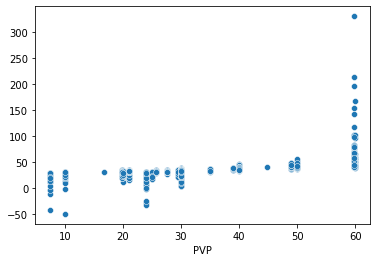

In [218]:
sns.scatterplot(y_test, predictions);

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PVP', ylabel='Density'>

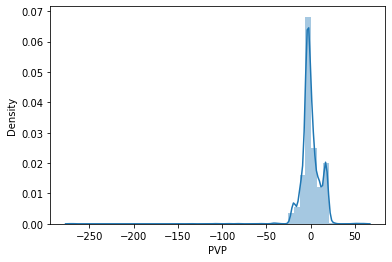

In [219]:
sns.distplot((y_test - predictions))

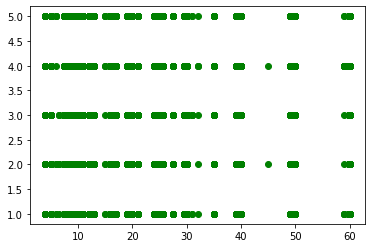

In [47]:
plt.scatter(df['PVP'], df['REGION_ID'], color = 'green')


In [ ]:
plt.scatter(df['PVP'], df['%DTO'], color = 'blue')

In [221]:
lm.score(X_test, y_test)

0.3409159475936484

In [222]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 7.432054266591804
MSE: 135.50926369616369
RMSE: 11.64084462984382


In [223]:
np.sqrt(metrics.mean_squared_error(y_test, predictions))/y.mean()

0.3442537030104641

In [169]:
intercept = lm.intercept_
features = pd.DataFrame(lm.coef_, X_train.columns, columns=['coefficient'])
features.head().sort_values('coefficient', ascending=False)

,coefficient
DTO,1.515705e-01
ARTICULO,-1.740496e-13
CICLO,-3.885707e-03
COD-MOV,-5.879632e-02
QTY,-9.900030e+00


In [ ]:
viz_train = plt
viz_train.scatter(X1_train, y1_train, color = 'blue')
viz_train.plot(X1_train, lm.predict(X1_train), color = "black")
viz_train.show()

In [170]:
X_train_scal

array([[ 0.62035403,  0.        , -0.52179908, ...,  0.267579  ,
        -0.62212594, -0.46395723],
       [-1.02108529,  0.        , -0.02488511, ...,  1.56681671,
         0.87756912,  0.30926264],
       [-1.07375179,  0.        , -0.02488511, ...,  0.83451255,
         0.87756912, -0.27065226],
       ...,
       [-1.02108529,  0.        ,  2.95659871, ..., -1.23571165,
        -0.62212594,  1.53352742],
       [-1.12641829,  0.        ,  0.96894283, ..., -0.27116965,
        -0.62212594, -0.01291231],
       [ 1.60346207,  0.        , -0.02488511, ..., -0.32221884,
        -0.62212594,  1.27578747]])

In [171]:
std_scale = preprocessing.StandardScaler().fit(X_train)
X_train_scal = std_scale.transform(X_train)

lm_scal = LinearRegression()
lm_scal.fit(X_train_scal, y_train)

intercept_scal = lm_scal.intercept_
features_std = pd.DataFrame(lm_scal.coef_, X_train.columns, columns=['coefficient'])

features_std.sort_values('coefficient', ascending=False)

,coefficient
AÑO,2.257562e+13
CATALOGO,9.595305e+11
PVP.ART,2.141748e+01
DTO,1.606934e+00
EDAD,7.334595e-01
COD_POST,-2.075195e-02
situacion,-1.376953e-01
PVP_TOT_FACT,-5.336914e-01
MES,-6.081543e-01
COD-MOV,-8.466797e-01


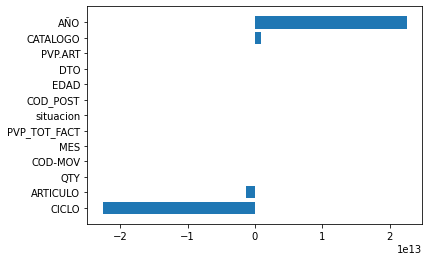

In [126]:
features_std = features_std.sort_values('coefficient', ascending=True)
plt.barh(features_std.index, features_std.coefficient);

In [ ]:
new_home = np.array([[100000, 20, 8, 9, 100000],
                    [200000, 40, 16, 18, 110000]])

lm.predict(new_home)

Random Forest Regresor

In [172]:
names = df_1.columns
rf = RandomForestRegressor(n_estimators = 100)
rf.fit(X, y)

scores = sorted(zip(map(lambda x: round(x, 4), rf.feature_importances_), names), reverse=True)
pd.DataFrame(scores, columns=['Score', 'Feature'])

,Score,Feature
0,0.4443,PVP
1,0.3800,QTY
2,0.1079,CICLO
3,0.0528,MES
4,0.0070,AÑO
5,0.0034,PVP_TOT_FACT
6,0.0028,COD-MOV
7,0.0011,DTO
8,0.0004,PVP.ART
9,0.0002,CATALOGO


In [175]:

print(X.shape)
sel = SelectKBest(k=6)
X_new = sel.fit_transform(X, y)
print(X_new.shape)
print(sel.scores_)

pd.DataFrame({'column': names, 'score': sel.scores_}).sort_values('score', ascending=False)

(16549, 13)
(16549, 6)
[1.89467843e+03            nan 9.38087569e+01 6.22623459e+02
 1.17388508e+02 1.19421370e+02 5.53202249e+01 1.84713069e+03
 7.90666965e+02 8.53265651e+02 1.25096260e+00 4.83447252e+01
 1.36238126e+01]


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [1] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


ValueError: All arrays must be of the same length

DecisionTreeRegressor

In [230]:
dtr = DecisionTreeRegressor()
dtr.fit(X_train, y_train)

DecisionTreeRegressor()

In [233]:
predictions_test = dtr.predict(X_train)

errors_test = abs(predictions_test - y_train)

print("MAE:", np.mean(errors_test))

MAE: 1.9309048489422392e-13


In [236]:
labels = np.array(df_1['PVP'])
features = df.drop('PVP', axis=1)
features_list = features.columns
features = np.array(features)

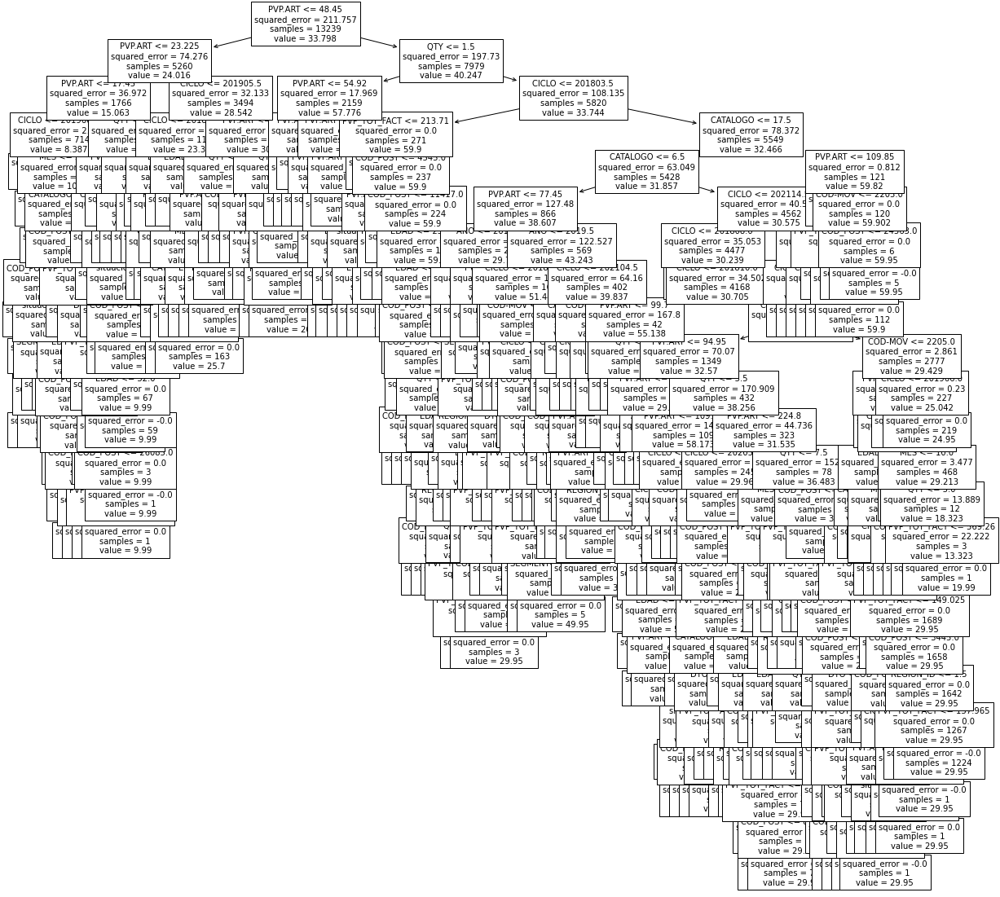

In [237]:
import matplotlib.pyplot as plt

plt.figure(figsize = (20, 20))
plot_tree(dtr,
          feature_names = features_list,
          class_names = 'PVP',
          fontsize = 10
        #   max_depth=2
          );

In [238]:
from sklearn.metrics import mean_absolute_error
dtr = DecisionTreeRegressor()
dtr.fit(X_train, y_train)

predictions_test = dtr.predict(X_test)

mean_absolute_error(y_test, predictions_test)

0.04455891238693975

In [239]:
dtr = DecisionTreeRegressor(max_depth = 3)
dtr.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3)

In [241]:
predictions = dtr.predict(X_train)
mean_absolute_error(y_train, predictions)

3.319922211985965

In [242]:
predictions_test = dtr.predict(X_test)
mean_absolute_error(y_test, predictions_test)

3.218698674853656

In [ ]:
# Fit regression model
regr_1 = DecisionTreeRegressor(max_depth=13)
regr_2 = DecisionTreeRegressor(max_depth=10)
regr_1.fit(X1, y1)
regr_2.fit(X1, y1)

# Predict
X_test = np.arange(0.0, 5.0, 0.01)[:, np.newaxis]
y_1 = regr_1.predict(X1_test)
y_2 = regr_2.predict(X1_test)

# Plot the results
plt.figure()
plt.scatter(X1, y1, s=20, edgecolor="black", c="darkorange", label="data")
plt.plot(X_test, y_1, color="cornflowerblue", label="max_depth=2", linewidth=2)
plt.plot(X_test, y_2, color="yellowgreen", label="max_depth=5", linewidth=2)
plt.xlabel("data")
plt.ylabel("target")
plt.title("Decision Tree Regression")
plt.legend()
plt.show()

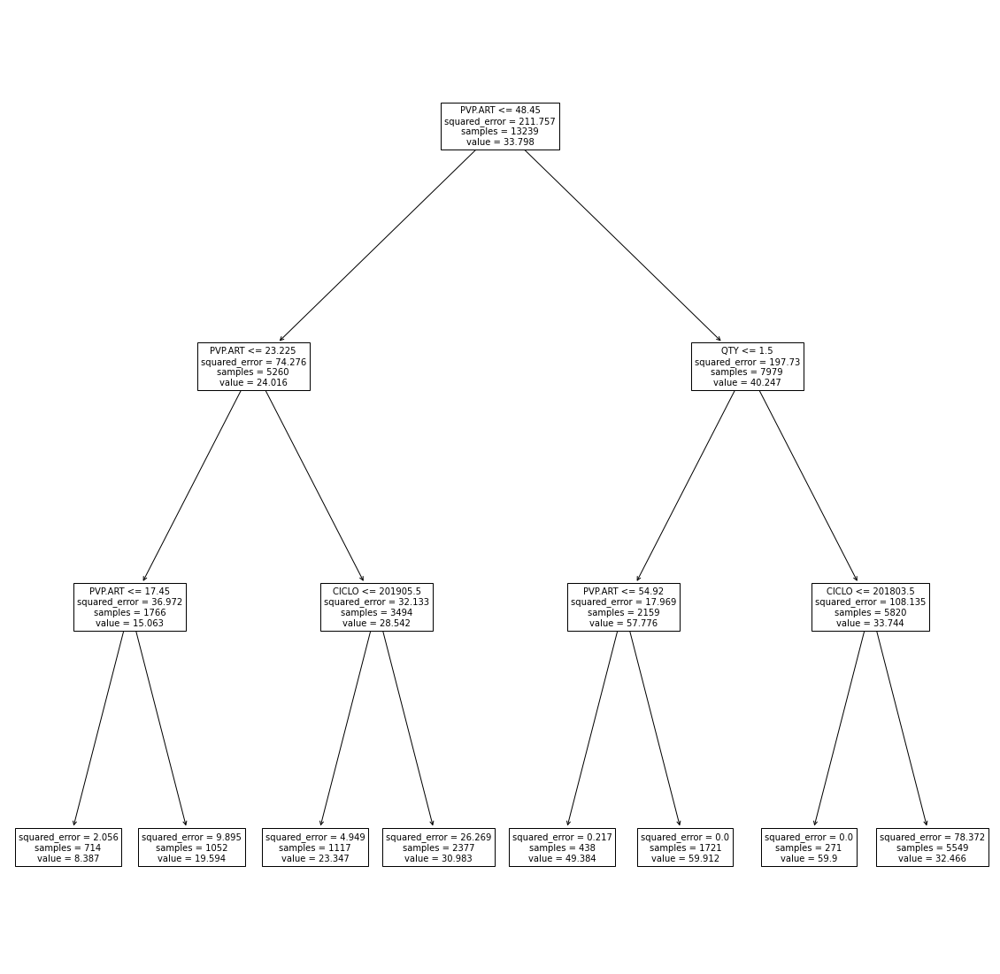

In [243]:
plt.figure(figsize = (20, 20))
plot_tree(dtr,
          feature_names = features_list,
          class_names = 'PVP',
          fontsize = 10
        #   max_depth=2
          );

In [244]:
set(predictions_test)

{8.387282913165224,
 19.593754752851737,
 23.347224709042486,
 30.982827092973892,
 32.466273202379945,
 49.38390410958921,
 59.89999999999974,
 59.911993027308355}

In [245]:
dtr.feature_importances_

array([0.        , 0.10432697, 0.        , 0.39742059, 0.        ,
       0.        , 0.49825243, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

In [246]:
features_list

Index(['REGION_ID', 'CICLO', 'ARTICULO', 'QTY', 'DTO', 'COD-MOV', 'PVP.ART',
       'PVP_TOT_FACT', 'AÑO', 'MES', 'CATALOGO', 'COD_POST', 'situacion',
       'EDAD', 'SEGMENTO_ID'],
      dtype='object')

In [247]:
my_dict = {'features': features_list,
           'importances': dtr.feature_importances_}

pd.DataFrame(my_dict).sort_values('importances', ascending=False)

,features,importances
6,PVP.ART,0.498252
3,QTY,0.397421
1,CICLO,0.104327
0,REGION_ID,0.000000
2,ARTICULO,0.000000
4,DTO,0.000000
5,COD-MOV,0.000000
7,PVP_TOT_FACT,0.000000
8,AÑO,0.000000
9,MES,0.000000


## Prueba con nuevos datos

In [ ]:
X_new = X_test[:1]
y_new = y_test[:1]
predicciones_rf_x_new = rndf.predict(X_new)
predicciones_rf_x_new

In [ ]:
lm = LinearRegression(n_jobs=-1)

dtr = DecisionTreeRegressor()

modelo_ada = AdaBoostRegressor(base_estimator=None)

modelo_gbr = GradientBoostingRegressor()

rndf = RandomForestRegressor()

lm_param = {}

dtr_param = {
    "max_depth": 13}
                                
modelo_ada_param = {
    "base_estimator": None,
    "n_estimators": 3, 
    "learning_rate":1.1, 
    "loss":'exponential', 
    "random_state":42}

modelo_gbr_param = {
            "n_estimators": 10000,
            "loss":'ls',
            "max_features":'auto',
            "random_state":42}

rndf_param = {"bootstrap":True, "criterion":'mse', "max_depth":None,
           "max_features":'auto', "max_leaf_nodes":None,
           "min_impurity_decrease":0.0,
           "min_samples_leaf":1, "min_samples_split":2,
           "min_weight_fraction_leaf":0.0, "n_estimators":10000, "n_jobs":-1,
           "oob_score":False, "random_state":42, "verbose":0, "warm_start":False}

#gs_lm = GridSearchCV(lm,
                    #n_jobs=-1)
gs_dtr = GridSearchCV(dtr,
                        dtr_param)

gs_modelo_ada = GridSearchCV(modelo_ada,
                        modelo_ada_param)

gs_modelo_gbr = GridSearchCV(modelo_gbr ,
                        modelo_gbr_param)

gs_rndf = GridSearchCV(rndf ,
                        rndf_param)


grids = {"gs_lm": gs_lm,
        "gs_dtr": gs_dtr,
        "gs_modelo_ada": gs_modelo_ada, 
        "gs_modelo_gbr": gs_modelo_gbr, 
        "gs_rndf": gs_rndf}